## SMITHFIELD ELECTION 1: SMITHFIELD CITY COUNCIL MEMBERS AT LARGE - BUT WITH EDUCATION DATA - NEED TO RENAME PLOTS

Okay, so before we plug in any data to these regression functions below we need to pull data from the voter registration files. We need to see how many votes of each race came in for each candidate.

In [3]:
from pathlib import Path
BASE_DIR = Path().resolve().parent.parent
import geopandas as gpd

In [5]:
smithEducData = gpd.read_file(BASE_DIR / 'EducationIncome_MergedShapefiles' / 'time_period_1123_121923' / 'time_period_1123_121923.shp')


In [6]:
smithEducData

,id,prec_id,enr_desc,county_nam,of_prec_id,county_id,total_vap,under_9g,9_to_12_nd,hs_grad,...,40k_45k,45k_50k,50k_60k,60k_75k,75k_100k,100k_125k,125k_150k,150k_200k,200k_plus,geometry
0,1,0003,ALBEMARLE NUMBER 3,STANLY,None,84,693.0,0.0,34.0,174.0,...,0.0,0.0,80.0,28.0,12.0,29.0,21.0,23.0,0.0,"POLYGON ((1667015.245 3988177.997, 1666989.967..."
1,2,0003,DREXEL 03,BURKE,None,12,1019.0,3.0,96.0,487.0,...,0.0,14.0,52.0,43.0,56.0,66.0,10.0,37.0,20.0,"POLYGON ((1530914.532 4012972.974, 1530908.691..."
2,22,0019,LINVILLE 01,BURKE,None,12,1750.0,0.0,107.0,375.0,...,78.0,40.0,29.0,59.0,139.0,114.0,125.0,34.0,33.0,"POLYGON ((1506510.448 4012071.01, 1506462.178 ..."
3,23,0019,RIDENHOUR,STANLY,None,84,1595.0,68.0,109.0,499.0,...,10.0,29.0,61.0,58.0,163.0,117.0,4.0,118.0,27.0,"POLYGON ((1649789.365 3989778.255, 1649797.768..."
4,71,007,007,MECKLENBURG,None,60,2265.0,102.0,39.0,335.0,...,96.0,12.0,152.0,132.0,34.0,122.0,65.0,95.0,279.0,"POLYGON ((1614812.835 3961959.041, 1614754.822..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2647,10150,JMV,JAMESVILLE,MARTIN,None,58,3004.0,66.0,443.0,980.0,...,154.0,72.0,40.0,186.0,189.0,101.0,30.0,75.0,81.0,"POLYGON ((1970369.612 4090576.148, 1970389.147..."
2648,10151,GRF,GRIFFINS,MARTIN,None,58,867.0,47.0,10.0,291.0,...,13.0,75.0,27.0,0.0,64.0,33.0,0.0,11.0,11.0,"POLYGON ((1946325.614 4074449.76, 1946309.697 ..."
2649,1962,GSN,GOOSE NEST,MARTIN,None,58,1212.0,55.0,163.0,433.0,...,88.0,19.0,32.0,153.0,37.0,8.0,23.0,7.0,71.0,"POLYGON ((1918364.771 4084470.039, 1918375.317..."
2650,2386,RBV,ROBERSONVILLE,MARTIN,None,58,2473.0,119.0,362.0,705.0,...,72.0,48.0,108.0,233.0,179.0,73.0,0.0,22.0,25.0,"POLYGON ((1920355.266 4078700.826, 1920301.807..."


In [30]:
import pandas as pd

# pull info from Smithfield Voter Registration files from Dr. Liza here!

# List of column names of what we might be interested in

#voted_party_cd
#pct_label
#pct_description
#race_code (U, W, B, O)
#ethnic_code (UN, NL)
#party_cd
#gender_code
#precinct_abbrv

# read in voter registration
smithEducData = gpd.read_file(BASE_DIR / 'EducationIncome_MergedShapefiles' / 'time_period_1123_121923' / 'time_period_1123_121923.shp')
smithEducData = smithEducData[smithEducData['county_nam'] == "JOHNSTON"] # filter to Johnston
smithEducData['prec_id'] = smithEducData["prec_id"].str[2:]


# Precincts: 24, 26, 27A, 27B 
# According to this website: https://www.nconemap.gov/datasets/voting-precincts/explore?location=35.517662%2C-78.451060%2C11.13
# Here are the corresponding names to counties (in order of Precinct Numbering)

prec_names = ["24", "26", "27A", "27B", "28"]
smithEducData = smithEducData[smithEducData['prec_id'].isin(prec_names)]


# Get the percentage of voters with a bachelors degree or higher in each precinct
# First, sum number of voters with bach_deg and grad_deg_plus
smithEducData["not_hs_grad"] = smithEducData['under_9g'] + smithEducData['9_to_12_nd']
smithEducData['percent_not_hs_grad'] = smithEducData['not_hs_grad'] / smithEducData['total_vap']


Okay, cool! We have some population percentages! Now lets look at how many people voted for the actual candidates. We can get this from the election results of the contest we're looking at in the voter registration: 11/07/2023.

In [32]:
# Listing column names we might want
# County
# Contest Name
# Choice
# Total Votes

# read in csv
all_election_res = pd.read_csv(BASE_DIR / "Election_Data_Sheets" / "csv" / 'results_pct_20231107.csv')

# grabbing only johnston
johnston_only_res = all_election_res[(all_election_res['County'] == 'JOHNSTON')]


# I'm picking a random candidate in a random election race to test. Hello Doris
doris_only_res = johnston_only_res[(johnston_only_res['Choice'] == 'Doris Louise Wallace')]


precincts = doris_only_res['Precinct'].tolist()
total_votes_d = doris_only_res['Total Votes'].tolist()

# grabbing the others in Doris' race
smithfield_council = johnston_only_res[(johnston_only_res['Contest Name'] ==
                                  'TOWN OF SMITHFIELD TOWN COUNCIL MEMBERS AT-LARGE')]

# Here are their names!
"""
Doris Louise Wallace
Felicia C. Baxter
John A. Dunn
Roger A. Wood
Stephen Rabil
Stuart Ashby Lee
Write-In (Miscellaneous)
"""

# Felicia C. Baxter
felicia_only_res = smithfield_council[(smithfield_council['Choice'] == 'Felicia C. Baxter')]

total_votes_f = felicia_only_res['Total Votes'].tolist()


# John A. Dunn
john_only_res = smithfield_council[(smithfield_council['Choice'] == 'John A. Dunn')]

total_votes_j = john_only_res['Total Votes'].tolist()


# Roger A. Wood
roger_only_res = smithfield_council[(smithfield_council['Choice'] == 'Roger A. Wood')]

total_votes_r = roger_only_res['Total Votes'].tolist()

# Stephen Rabil
stephen_only_res = smithfield_council[(smithfield_council['Choice'] == 'Stephen Rabil')]

total_votes_s = stephen_only_res['Total Votes'].tolist()


# Stuart Ashby Lee
ashby_only_res = smithfield_council[(smithfield_council['Choice'] == 'Stuart Ashby Lee')]

total_votes_a = ashby_only_res['Total Votes'].tolist()


# Write-ins
write_in_res = smithfield_council[(smithfield_council['Choice'] == 'Write-In (Miscellaneous)')]

total_votes_w = write_in_res['Total Votes'].tolist()


# Totaling all votes
total_votes_overall = []

for i in range(len(total_votes_d)):
  total_votes_overall.append(total_votes_d[i] + total_votes_f[i] + total_votes_j[i]
              + total_votes_r[i] + total_votes_s[i] + total_votes_a[i] + total_votes_w[i])

print(total_votes_overall)

[22, 522, 630, 364, 1361]


Yippee! Let's try to plot an environmental regression.

In [33]:
# installs and imports

import numpy as np
import pymc as pm

from pyei.data import Datasets
from pyei.two_by_two import TwoByTwoEI
from pyei.goodmans_er import GoodmansER
from pyei.goodmans_er import GoodmansERBayes

from pyei.plot_utils import tomography_plot
from pyei.plot_utils import plot_precinct_scatterplot

In [36]:
# formatting, let's use doris and black voters
doris_percent = []
for i in range(len(total_votes_overall)):
  doris_percent.append(total_votes_d[i] / total_votes_overall[i])

not_hs_grad = smithEducData['percent_not_hs_grad'].tolist()

print(doris_percent)
print(not_hs_grad)

# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(doris_percent)


demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "Doris"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

[0.18181818181818182, 0.34674329501915707, 0.14126984126984127, 0.16758241758241757, 0.09698750918442321]
[0.06959231368475721, 0.20767888307155322, 0.09608091024020228, 0.16238723108952116, 0.0877584110255371]


Here is some information about her!

https://nclcv.org/board/doris-wallace/

https://ballotpedia.org/Doris_Louise_Wallace_(Smithfield_Town_Council_Member_District_4,_North_Carolina,_candidate_2022)

https://nclcvf.org/fellow-mentor/doris-wallace/

https://www.facebook.com/DorisforSmithfield/


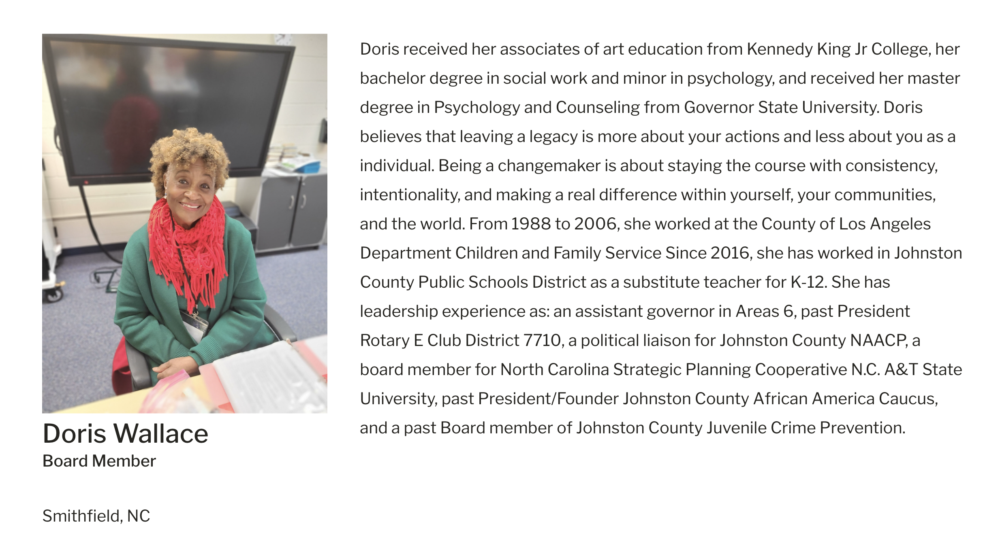

Now that things are set up, let's actually plot!

Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for Doris is
        1.316
        Est. fraction of non- No High School Degree
        voters who voted for Doris is
        0.026
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for Doris'>)

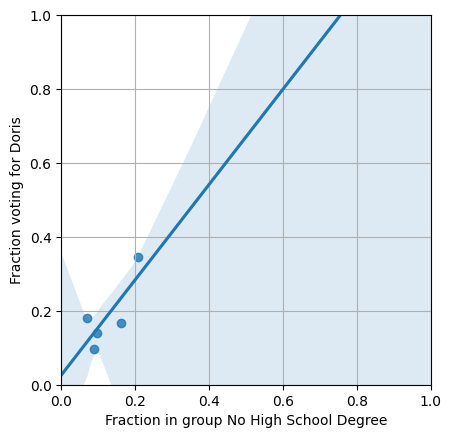

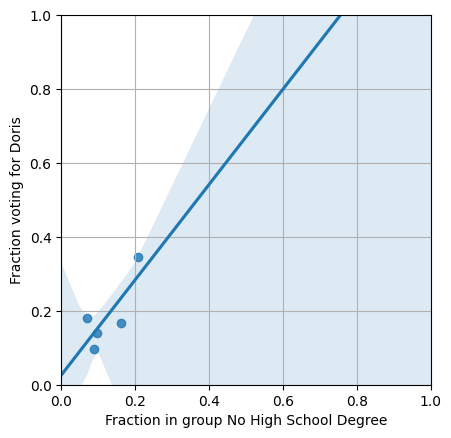

In [37]:
# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

YAAYYYY IT WORKS. Lets do Felicia C. Baxter next

Links:

https://ballotpedia.org/Felicia_C._Baxter_(Smithfield_Town_Council_Member_District_1,_North_Carolina,_candidate_2025)

https://www.electfeliciacbaxter.com/

https://www.facebook.com/trejoconsulting/

https://about.me/electfeliciacbaxter


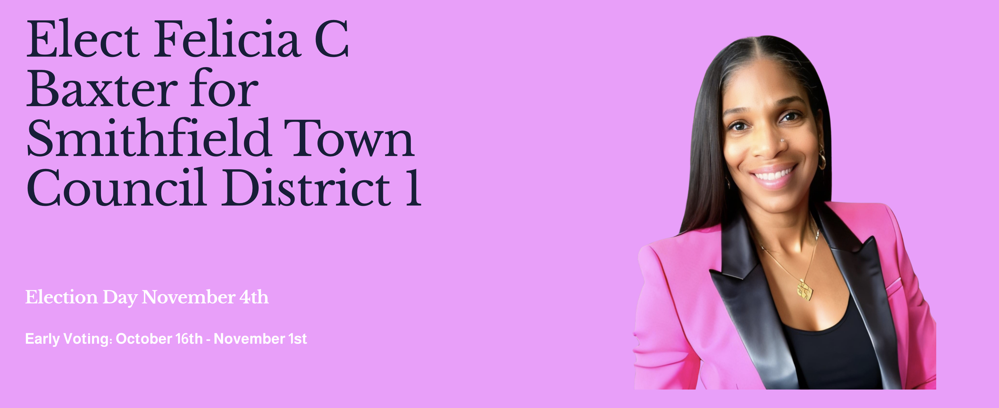

[0.18181818181818182, 0.18007662835249041, 0.08571428571428572, 0.054945054945054944, 0.048493754592211606]
Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for Felicia is
        0.288
        Est. fraction of non- No High School Degree
        voters who voted for Felicia is
        0.085
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for Felicia'>)

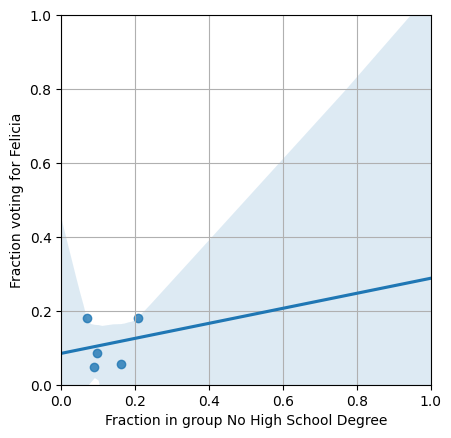

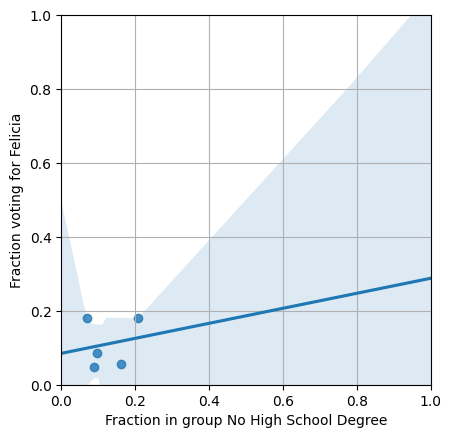

In [38]:
# formatting, let's use felicia and black voters
felicia_percent = []
for i in range(len(total_votes_overall)):
  felicia_percent.append(total_votes_f[i] / total_votes_overall[i])

print(felicia_percent)

# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(felicia_percent)

demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "Felicia"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Let's do John A. Dunn!

Links:

https://www.facebook.com/Electjohndunn/

https://ballotpedia.org/John_Dunn_(North_Carolina)



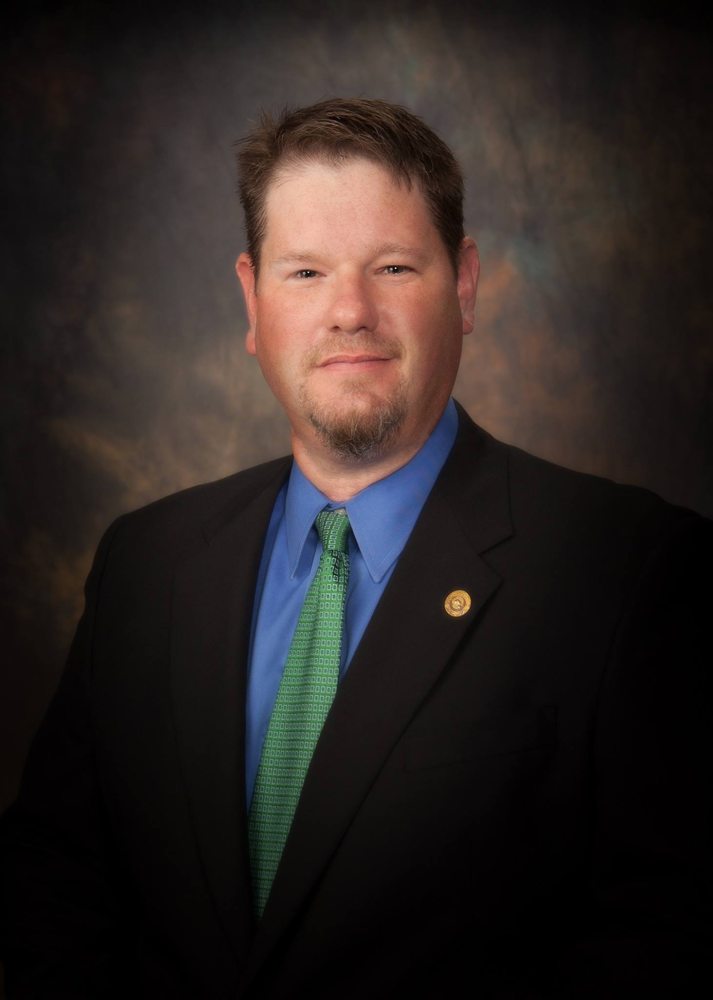

[0.18181818181818182, 0.34674329501915707, 0.14126984126984127, 0.16758241758241757, 0.09698750918442321]
Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for John is
        1.316
        Est. fraction of non- No High School Degree
        voters who voted for John is
        0.026
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for John'>)

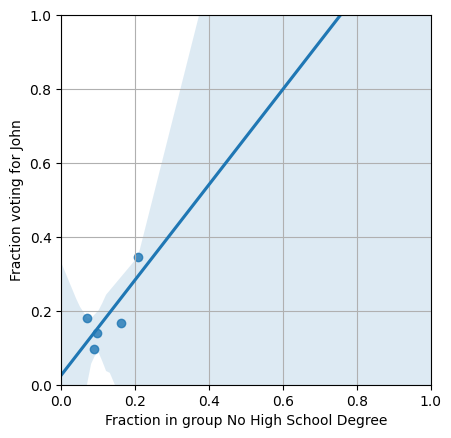

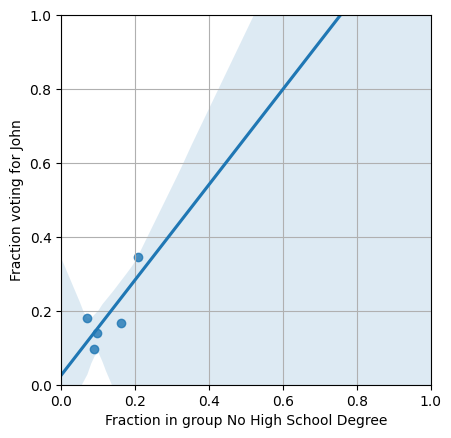

In [39]:
# formatting, let's use john and black voters
john_percent = []
for i in range(len(total_votes_overall)):
  john_percent.append(total_votes_d[i] / total_votes_overall[i])

print(john_percent)

# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(john_percent)


demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "John"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Now Roger A. Wood

Links:

https://www.facebook.com/p/Roger-Allen-Wood-for-Smithfield-Town-Council-100064453973167/

https://ballotpedia.org/Roger_Allen_Wood

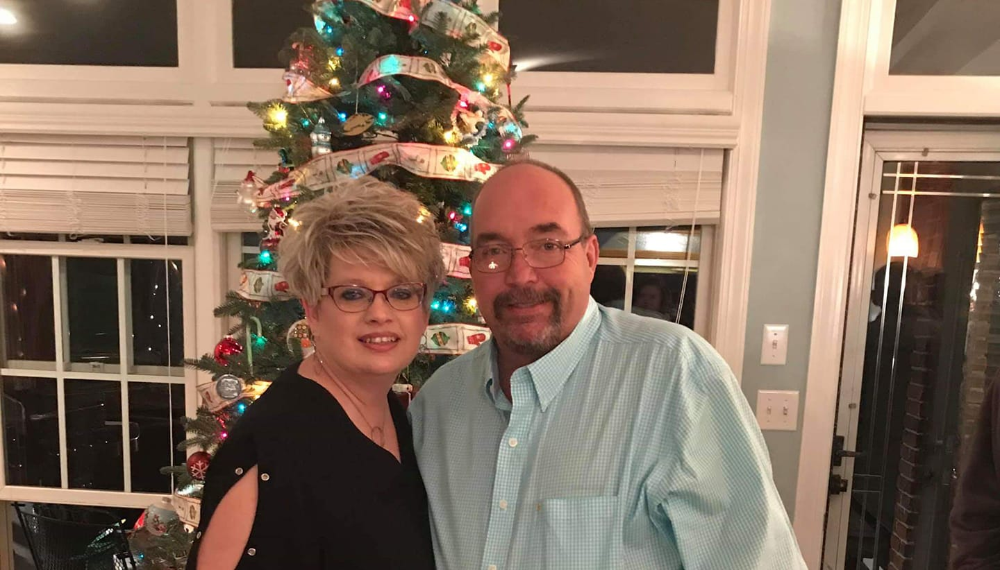

Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for Roger is
        -0.437
        Est. fraction of non- No High School Degree
        voters who voted for Roger is
        0.310
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for Roger'>)

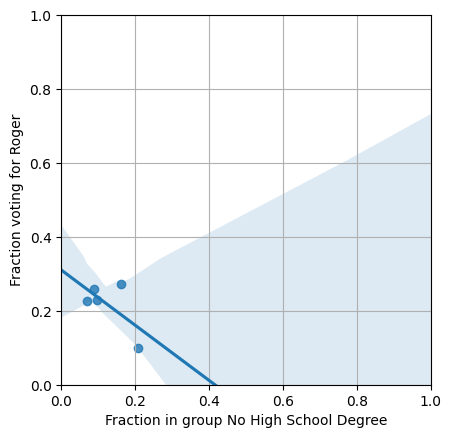

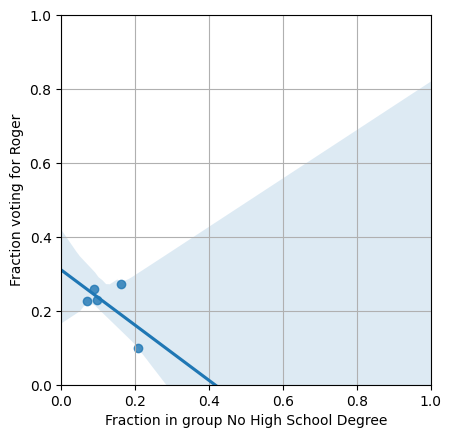

In [40]:
# formatting, let's use roger and black voters
roger_percent = []
for i in range(len(total_votes_overall)):
  roger_percent.append(total_votes_r[i] / total_votes_overall[i])

# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(roger_percent)


demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "Roger"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Stephen Rabil

Links:

https://ballotpedia.org/Stephen_Rabil


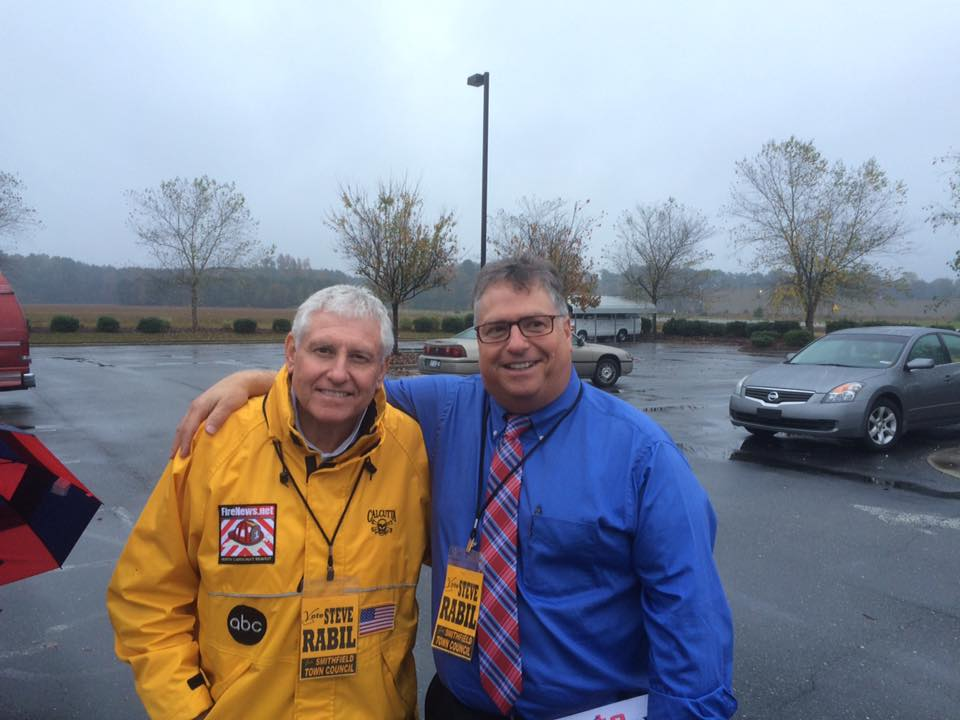

Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for Stephen is
        0.121
        Est. fraction of non- No High School Degree
        voters who voted for Stephen is
        0.191
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for Stephen'>)

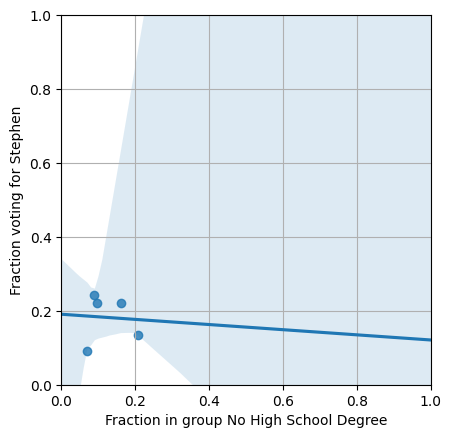

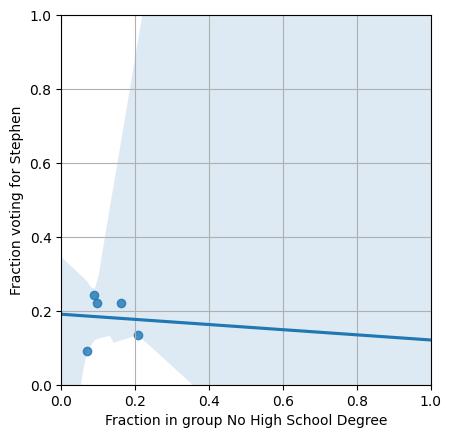

In [41]:
# formatting, let's use stephen and black voters
stephen_percent = []
for i in range(len(total_votes_overall)):
  stephen_percent.append(total_votes_s[i] / total_votes_overall[i])

# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(stephen_percent)


demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "Stephen"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Stuart Ashby Lee

Links:

https://www.facebook.com/p/Stuart-Ashby-Lee-for-Mayor-61578706343859/

https://ballotpedia.org/Stuart_Ashby_Lee_(Mayor_of_Smithfield,_North_Carolina,_candidate_2025)

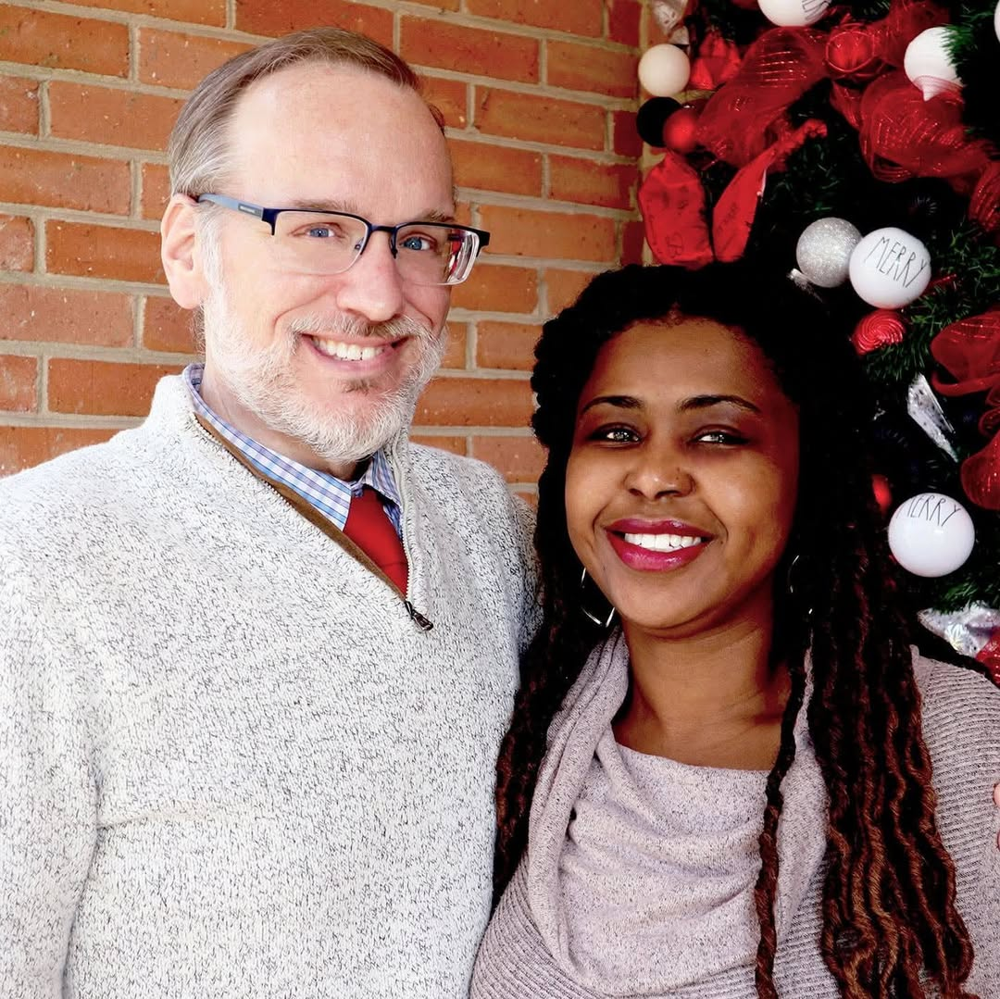

Goodmans ER
        Est. fraction of No High School Degree
        voters who voted for Stuart is
        0.378
        Est. fraction of non- No High School Degree
        voters who voted for Stuart is
        0.061
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group No High School Degree', ylabel='Fraction voting for Stuart'>)

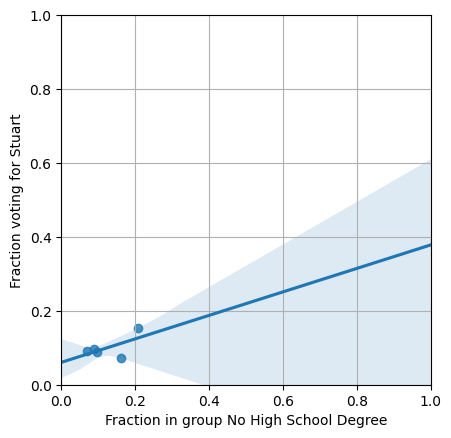

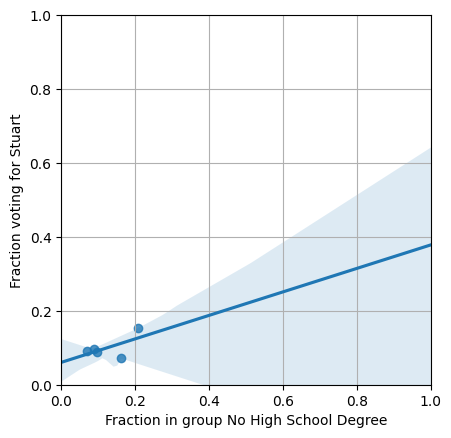

In [42]:
# formatting, let's use stuart and black voters
ashby_percent = []
for i in range(len(total_votes_overall)):
  ashby_percent.append(total_votes_a[i] / total_votes_overall[i])


# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(ashby_percent)


demographic_group_name_2by2 = "No High School Degree"
candidate_name_2by2 = "Stuart"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Write-ins

Goodmans ER
        Est. fraction of Bachelors Degree or Higher
        voters who voted for Write-Ins is
        0.068
        Est. fraction of non- Bachelors Degree or Higher
        voters who voted for Write-Ins is
        -0.006
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group Bachelors Degree or Higher', ylabel='Fraction voting for Write-Ins'>)

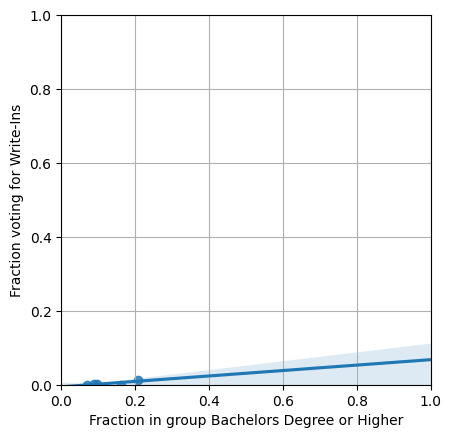

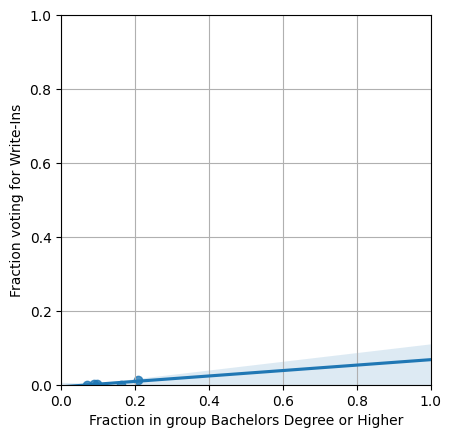

In [43]:
# formatting, let's use write-in and black voters
writein_percent = []
for i in range(len(total_votes_overall)):
  writein_percent.append(total_votes_w[i] / total_votes_overall[i])


# loading in the data
group_fraction_2by2 = np.array(not_hs_grad)
votes_fraction_2by2 = np.array(writein_percent)


demographic_group_name_2by2 = "Bachelors Degree or Higher"
candidate_name_2by2 = "Write-Ins"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

## NEW ELECTION: TOWN OF SMITHFIELD MAYOR - NOT EDITED YET

Let's repeat the stuff above for the Town of Smithfield Mayoral elections!

In [88]:
# read in csv
all_election_res = pd.read_csv(BASE_DIR / "Election_Data_Sheets" / "csv" / 'results_pct_20231107.csv')

# grabbing only johnston
johnston_only_res = all_election_res[(all_election_res['County'] == 'JOHNSTON')]


# grabbing the candidates in the specific race
smithfield_council = johnston_only_res[(johnston_only_res['Contest Name'] ==
                                  'TOWN OF SMITHFIELD MAYOR')]

precincts = smithfield_council['Precinct'].tolist()

# Here are their names!
"""
Andy Moore
Marlon Lee
Write-In (Miscellaneous)
"""

# Andy Moore
andy_only_res = smithfield_council[(smithfield_council['Choice'] == 'Andy Moore')]

total_votes_a = andy_only_res['Total Votes'].tolist()


# Marlon Lee
marlon_only_res = smithfield_council[(smithfield_council['Choice'] == 'Marlon Lee')]

total_votes_m = marlon_only_res['Total Votes'].tolist()

# Write-ins
write_in_res = smithfield_council[(smithfield_council['Choice'] == 'Write-In (Miscellaneous)')]

total_votes_w = write_in_res['Total Votes'].tolist()


# Totaling all votes
total_votes_overall = []

for i in range(len(total_votes_a)):
  total_votes_overall.append(total_votes_a[i] + total_votes_m[i]
                             + total_votes_w[i])

print(total_votes_overall)

[10, 280, 266, 152, 519]


Andy Moore

Links:

https://www.smithfield-nc.com/page/admin_mayor

https://ballotpedia.org/Andy_Moore

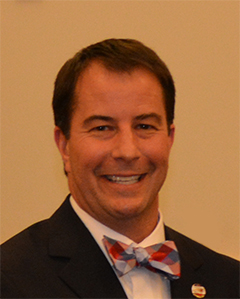

Goodmans ER
        Est. fraction of Bachelors Degree or Higher
        voters who voted for Andy is
        1.001
        Est. fraction of non- Bachelors Degree or Higher
        voters who voted for Andy is
        0.407
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group Bachelors Degree or Higher', ylabel='Fraction voting for Andy'>)

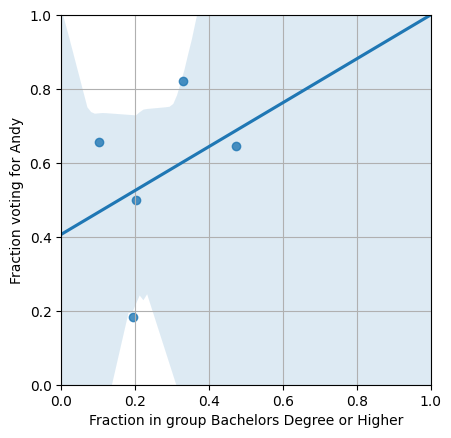

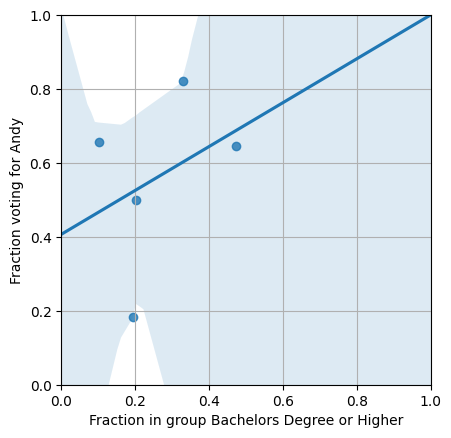

In [89]:
# formatting, let's use andy and black voters
andy_percent = []
for i in range(len(total_votes_overall)):
 andy_percent.append(total_votes_a[i] / total_votes_overall[i])

bach_plus_perc = smithEducData['percent_bach_higher'].tolist()

# loading in the data
group_fraction_2by2 = np.array(bach_plus_perc)
votes_fraction_2by2 = np.array(andy_percent)


demographic_group_name_2by2 = "Bachelors Degree or Higher"
candidate_name_2by2 = "Andy"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Marlon Lee

Links:

https://ballotpedia.org/Marlon_Lee_(Smithfield_Town_Council_Member_District_1,_North_Carolina,_candidate_2022)

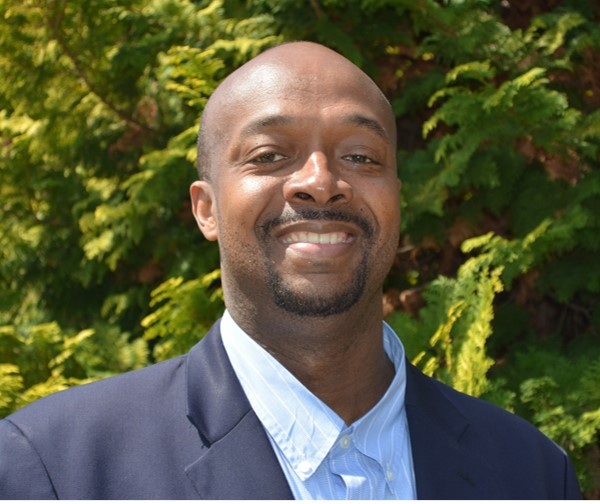

Goodmans ER
        Est. fraction of Bachelors Degree or Higher
        voters who voted for Marlon is
        -0.020
        Est. fraction of non- Bachelors Degree or Higher
        voters who voted for Marlon is
        0.597
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group Bachelors Degree or Higher', ylabel='Fraction voting for Marlon'>)

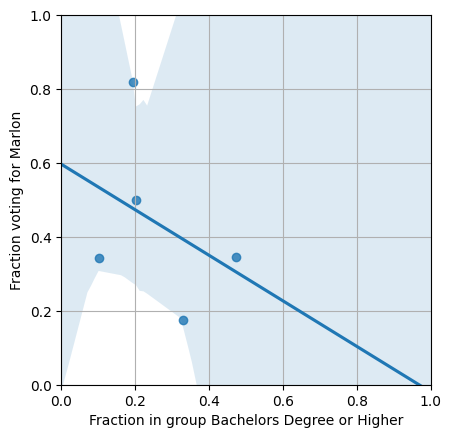

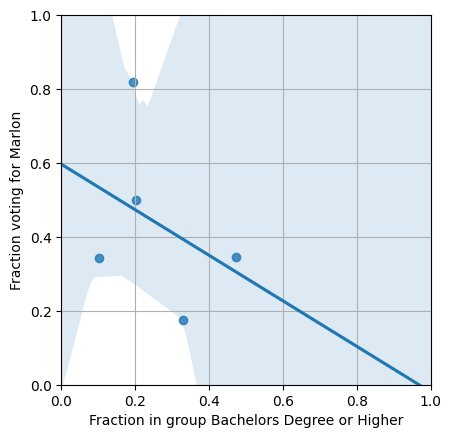

In [90]:
# formatting, let's use marlon and black voters
marlon_percent = []
for i in range(len(total_votes_overall)):
 marlon_percent.append(total_votes_m[i] / total_votes_overall[i])


# loading in the data
group_fraction_2by2 = np.array(bach_plus_perc)
votes_fraction_2by2 = np.array(marlon_percent)


demographic_group_name_2by2 = "Bachelors Degree or Higher"
candidate_name_2by2 = "Marlon"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})

Write-Ins

Goodmans ER
        Est. fraction of Bachelors Degree or Higher
        voters who voted for Write-ins is
        0.019
        Est. fraction of non- Bachelors Degree or Higher
        voters who voted for Write-ins is
        -0.004
        


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='Fraction in group Bachelors Degree or Higher', ylabel='Fraction voting for Write-ins'>)

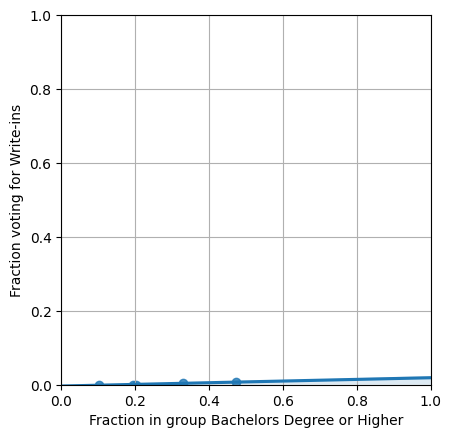

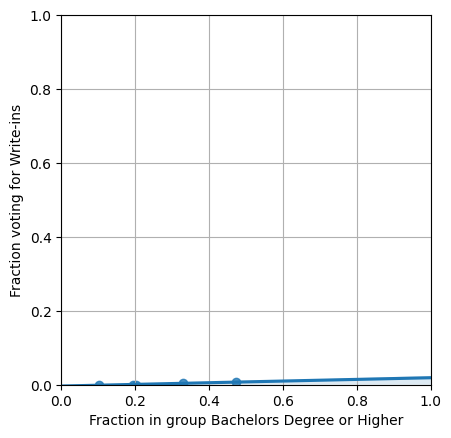

In [91]:
# formatting, let's use write-ins and black voters
writein_percent = []
for i in range(len(total_votes_overall)):
  writein_percent.append(total_votes_w[i] / total_votes_overall[i])


# loading in the data
group_fraction_2by2 = np.array(bach_plus_perc)
votes_fraction_2by2 = np.array(writein_percent)


demographic_group_name_2by2 = "Bachelors Degree or Higher"
candidate_name_2by2 = "Write-ins"

# Data we'll use in both 2x2 and rbyc
precinct_pops = np.array(total_votes_overall)
precinct_names = np.array(precincts)

# Create a GoodmansER object
goodmans_er = GoodmansER()

# Fit the model
goodmans_er.fit(
    group_fraction_2by2,
    votes_fraction_2by2,
    demographic_group_name=demographic_group_name_2by2,
    candidate_name=candidate_name_2by2
)
print(goodmans_er.summary())

# default plots
goodmans_er.plot()

# You can pass additional keyword arguments to be accepted by seaborn's regplot, e.g. changing the color of lines and points
scatter_colors = ["red" if p > 500 else "blue" for p in precinct_pops]
goodmans_er.plot(scatter_kws={"c": scatter_colors, "color": None, "s": 20}, line_kws={"color":"black", "lw": 1})